# SECTION B

## 1. Basic: Load the English proverbs, which have been translated by Llama-3-8b-instruct. Report any redundant text you find in these.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import folium


# Load dataset
url = "https://raw.githubusercontent.com/greek-proverb-atlas/proverbs.gr/refs/heads/main/data/balanced_corpus_en.csv"
data = pd.read_csv(url)

data.columns

# Rename columns
data.rename(columns={'text': 'greek_proverb', 'llama-8b': 'english_proverb'}, inplace=True)

# Display the renamed columns and the first few rows
print("Renamed Columns:", data.columns)
data.head()


Renamed Columns: Index(['Unnamed: 0', 'greek_proverb', 'place', 'uri', 'collector', 'area',
       'lat', 'lon', 'english_proverb'],
      dtype='object')


,Unnamed: 0,greek_proverb,place,uri,collector,area,lat,lon,english_proverb
0,105697,Γέλια σαν κομπολόγια,"Ήπειρος, Ζαγόρι, Βίτσα",http://hdl.handle.net/20.500.11853/168435,"Σάρρος, Δημήτριος Μ.",Ήπειρος,37.998253,23.737867,Laughter is like a rosary. (A rosary is a string
1,8413,Καρδίαν καθαράν θέλ' ο Θεός,Ήπειρος,http://hdl.handle.net/20.500.11853/167032,"Γόνιος, Α.",Ήπειρος,37.998253,23.737867,God asks for a clean heart. (Proverb) <|eot_id
2,7684,Ου Θεός κι ου γείτονας,Ήπειρος,http://hdl.handle.net/20.500.11853/168991,"Γαλδέμης, Αναστάσιος Δ.",Ήπειρος,37.998253,23.737867,No God and no neighbor. (meaning that when you...
3,18546,Θέλει να κρυφθή πίσω από το δάχτυλό του,Ήπειρος,http://hdl.handle.net/20.500.11853/273352,"Ζηκίδης, Γεώργιος Δ.",Ήπειρος,37.998253,23.737867,He wants to hide behind his finger. (Proverb: ...
4,94001,Όλοι κλαίν' τα χάλια τ'ς κι ο μυλωνάς τη δέσι,Ήπειρος,http://hdl.handle.net/20.500.11853/204755,"Παπαγεωργίου, Ιωάννης",Ήπειρος,37.998253,23.737867,"All cry over the mess, but the miller is the o..."


Below are reported the redundant texts, including stop words. The regex pattern r'r'\s*\(.*?\)\s*|\s*<.*?>\s*|\s*\(.*|\s*<.*|\W'' removes unwanted text from a string, such as content within parentheses (...), angle brackets <...>`, and any trailing characters after these symbols. 

Stop words are common words (like "the," "is," "and") that are often filtered out in natural language processing because they add little meaning, allowing the analysis to focus on more significant terms.

In [2]:
import re
from stopwordsiso import stopwords  # Import stopwords from stopwords-iso
from collections import Counter

# Define stop words from stopwords-iso in contrary to nltk contains most modern greek.
english_stop_words = set(stopwords("en")) | {"proverb"}  # Adding custom words

# All Greek letters that are used in speaking language and have been attributed in written.
greek_letters_upper = set("ΑΒΓΔΕΖΗΘΙΚΛΜΝΞΟΠΡΣΤΥΦΧΨΩ")
greek_letters_lower = set("αβγδεζηθικλμνξοπρστυφχψως")


# Combine Greek letters and idioms into one set
greek_stop_words = set(stopwords("el")) | greek_letters_upper | greek_letters_lower  # Greek stop words including idioms and letters

# Initialize DataFrame columns
data['redundant_text'] = ''
data['common_words_english'] = ''
data['common_words_greek'] = ''

# Iterate over each row in the DataFrame
for index in range(len(data)):
    # Process 'english_proverb'
    original_english = data.iloc[index]['english_proverb']
    
    # Extract redundant text from 'english_proverb' based on pattern
    data.at[index, 'redundant_text'] = re.findall(r'\s*\(.*?\)\s*|\s*<.*?>\s*|\s*\(.*|\s*<.*|\W', original_english, flags=re.DOTALL)

    # Count stop words in 'english_proverb'
    words_english = re.findall(r'\b\w+\b', original_english.lower())
    data.at[index, 'common_words_english'] = dict(Counter(word for word in words_english if word in english_stop_words))

    # Process 'greek_proverb'
    original_greek = data.iloc[index]['greek_proverb']
    
    # Count stop words in 'greek_proverb'
    words_greek = re.findall(r'\b\w+\b', original_greek.lower())
    data.at[index, 'common_words_greek'] = dict(Counter(word for word in words_greek if word in greek_stop_words))

# Display relevant columns
data[['greek_proverb', 'english_proverb', 'redundant_text', 'common_words_english', 'common_words_greek']]


,greek_proverb,english_proverb,redundant_text,common_words_english,common_words_greek
0,Γέλια σαν κομπολόγια,Laughter is like a rosary. (A rosary is a string,"[ , , , , ., (A rosary is a string]","{'is': 2, 'like': 1, 'a': 3}",{'σαν': 1}
1,Καρδίαν καθαράν θέλ' ο Θεός,God asks for a clean heart. (Proverb) <|eot_id,"[ , , , , , ., (Proverb) , <|eot_id]","{'asks': 1, 'for': 1, 'a': 1, 'proverb': 1}",{'ο': 1}
2,Ου Θεός κι ου γείτονας,No God and no neighbor. (meaning that when you...,"[ , , , , ., (meaning that when you are in...","{'no': 3, 'and': 1, 'that': 1, 'when': 1, 'you...","{'ου': 2, 'κι': 1}"
3,Θέλει να κρυφθή πίσω από το δάχτυλό του,He wants to hide behind his finger. (Proverb: ...,"[ , , , , , , ., (Proverb: To hide behin...","{'he': 1, 'wants': 1, 'to': 2, 'behind': 2, 'h...","{'να': 1, 'από': 1, 'το': 1, 'του': 1}"
4,Όλοι κλαίν' τα χάλια τ'ς κι ο μυλωνάς τη δέσι,"All cry over the mess, but the miller is the o...","[ , , , , ,, , , , , , , , ', ]","{'all': 1, 'cry': 1, 'over': 1, 'the': 3, 'but...","{'τα': 1, 'τ': 1, 'ς': 1, 'κι': 1, 'ο': 1, 'τη..."
...,...,...,...,...,...
11495,Παστρζικό τσανα τσ' έναι!,A snake in the grass is not seen! or A snake i...,"[ , , , , , , , !, , , , , , , ]","{'a': 2, 'in': 2, 'the': 2, 'is': 2, 'not': 1,...",{}
11496,"Κάλλιο γεναίκα κάμισσα, πέρζι πολυπροικούσα",It is better to have a small profit than a lar...,"[ , , , , , , , , , , , ., , , ]","{'it': 1, 'is': 1, 'better': 1, 'to': 1, 'have...",{}
11497,Όγοιος κάθεται στη στερζά τσαί θάλασσα γερεύει...,The devil of one's backside is always quicker ...,"[ , , , ', , , , , , , , , , ]","{'the': 3, 'of': 2, 'one': 1, 's': 1, 'is': 1,...","{'στη': 1, 'ο': 1, 'τ': 2, 'του': 1}"
11498,Πήε στ' δαιμόνου τ' μάννα,Take the devil's mother. (Take the devil's mot...,"[ , , ', , ., (Take the devil's mother to y...","{'take': 2, 'the': 2, 's': 2, 'to': 1, 'your': 1}",{'τ': 1}


## 2.Preprocessing: Using Regular Expressions, post-process the outcome by removing redundant text (e.g., following the translation in parenthesis).

In [9]:
import re

# Initialize new columns for cleaned text (retaining stopwords) and text without stopwords
data['cleaned_english_proverb'] = ''
data['cleaned_greek_proverb'] = ''
data['english_proverb_no_stopwords'] = ''
data['greek_proverb_no_stopwords'] = ''

for index in range(len(data)):
    # Process 'english_proverb'
    original_english = data.iloc[index]['english_proverb']
    
    # Remove phrases like "The English translation of the given proverb is" and other redundant text and rymbols
    cleaned_english = re.sub(
        r'\bThe English translation of the given proverb is\b|\bThe translation to English is\b|\s*\(.*?\)\s*|\s*<.*?>\s*|\s*\(.*|\s*<.*|\W', 
        ' ', 
        original_english, 
        flags=re.DOTALL
    ).strip()
    # \bThe English translation of the given proverb is\b - Matches the exact phrase "The English translation of the given proverb is" as a whole word
    # \bThe translation to English is\b - Matches the exact phrase "The translation to English is" as a whole word
    # \s*\(.*?\)\s* - Matches text in parentheses with optional whitespace around it
    # \s*<.*?>\s* - Matches text in angle brackets with optional whitespace around it
    # \s*\(.* - Matches any text starting with an open parenthesis to the end of the string
    # \s*<.* - Matches any text starting with an open angle bracket to the end of the string
    # \W - Matches any non-word character (not a letter, digit, or underscore)
    
    data.at[index, 'cleaned_english_proverb'] = cleaned_english

    # Remove stopwords for English
    english_words = cleaned_english.split()
    filtered_english_words = [word for word in english_words if word.lower() not in english_stop_words]
    data.at[index, 'english_proverb_no_stopwords'] = ' '.join(filtered_english_words)

    # Process 'greek_proverb'
    original_greek = data.iloc[index]['greek_proverb']
    
    # Remove redundant text in parentheses or angle brackets
    cleaned_greek = re.sub(
        r'\s*\(.*?\)\s*|\s*<.*?>\s*|\s*\(.*|\s*<.*|\W', 
        ' ', 
        original_greek, 
        flags=re.DOTALL
    ).strip()
    
    data.at[index, 'cleaned_greek_proverb'] = cleaned_greek

    # Remove stopwords for Greek
    greek_words = cleaned_greek.split()
    filtered_greek_words = [word for word in greek_words if word.lower() not in greek_stop_words]
    data.at[index, 'greek_proverb_no_stopwords'] = ' '.join(filtered_greek_words)
pd.set_option('display.max_rows', None)

# Display the cleaned translations for comparison
data[['greek_proverb', 'english_proverb', 'cleaned_english_proverb', 'english_proverb_no_stopwords', 'cleaned_greek_proverb', 'greek_proverb_no_stopwords']]


,greek_proverb,english_proverb,cleaned_english_proverb,english_proverb_no_stopwords,cleaned_greek_proverb,greek_proverb_no_stopwords
0,Γέλια σαν κομπολόγια,Laughter is like a rosary. (A rosary is a string,Laughter is like a rosary,Laughter rosary,Γέλια σαν κομπολόγια,Γέλια κομπολόγια
1,Καρδίαν καθαράν θέλ' ο Θεός,God asks for a clean heart. (Proverb) <|eot_id,God asks for a clean heart,God clean heart,Καρδίαν καθαράν θέλ ο Θεός,Καρδίαν καθαράν θέλ Θεός
2,Ου Θεός κι ου γείτονας,No God and no neighbor. (meaning that when you...,No God and no neighbor,God neighbor,Ου Θεός κι ου γείτονας,Θεός γείτονας
3,Θέλει να κρυφθή πίσω από το δάχτυλό του,He wants to hide behind his finger. (Proverb: ...,He wants to hide behind his finger,hide finger,Θέλει να κρυφθή πίσω από το δάχτυλό του,Θέλει κρυφθή πίσω δάχτυλό
4,Όλοι κλαίν' τα χάλια τ'ς κι ο μυλωνάς τη δέσι,"All cry over the mess, but the miller is the o...",All cry over the mess but the miller is the o...,mess miller,Όλοι κλαίν τα χάλια τ ς κι ο μυλωνάς τη δέσι,Όλοι κλαίν χάλια μυλωνάς δέσι
5,Σε ξένο φαγεί να μη βάνης άλας,Don't add salt to a foreign dish. (Don't inter...,Don t add salt to a foreign dish,add salt foreign dish,Σε ξένο φαγεί να μη βάνης άλας,ξένο φαγεί βάνης άλας
6,Μου το βγαλε απ' τις μύτες,He pulled it out of my ears<|eot_id|>,He pulled it out of my ears,pulled ears,Μου το βγαλε απ τις μύτες,βγαλε μύτες
7,Γίγκι για κουρκούτ',The English translation of the given proverb i...,Hurry for nothing or,Hurry,Γίγκι για κουρκούτ,Γίγκι κουρκούτ
8,Ειναι στα ολίστια,It's at its worst<|eot_id|>,It s at its worst,worst,Ειναι στα ολίστια,ολίστια
9,Όξ' απού θάνατου!,From death nothing is born. (A thing that has ...,From death nothing is born,death born,Όξ απού θάνατου,Όξ απού θάνατου


## 3.Exploration: Compare the number of characters and words between the two languages, Greek and (post-processed) English. Compute and compare the most frequent words per language

Character and Word Counts for Cleaned Greek Proverbs:
                            cleaned_greek_proverb  greek_character_count  \
0                           Γέλια σαν κομπολόγια                     20   
1                    Καρδίαν καθαράν θέλ  ο Θεός                     27   
2                         Ου Θεός κι ου γείτονας                     22   
3        Θέλει να κρυφθή πίσω από το δάχτυλό του                     39   
4  Όλοι κλαίν  τα χάλια τ ς κι ο μυλωνάς τη δέσι                     45   

   greek_word_count  
0                 3  
1                 5  
2                 5  
3                 8  
4                11  

Character and Word Counts for Cleaned English Proverbs:
                              cleaned_english_proverb  english_character_count  \
0                          Laughter is like a rosary                       25   
1                         God asks for a clean heart                       26   
2                             No God and no neighbor         

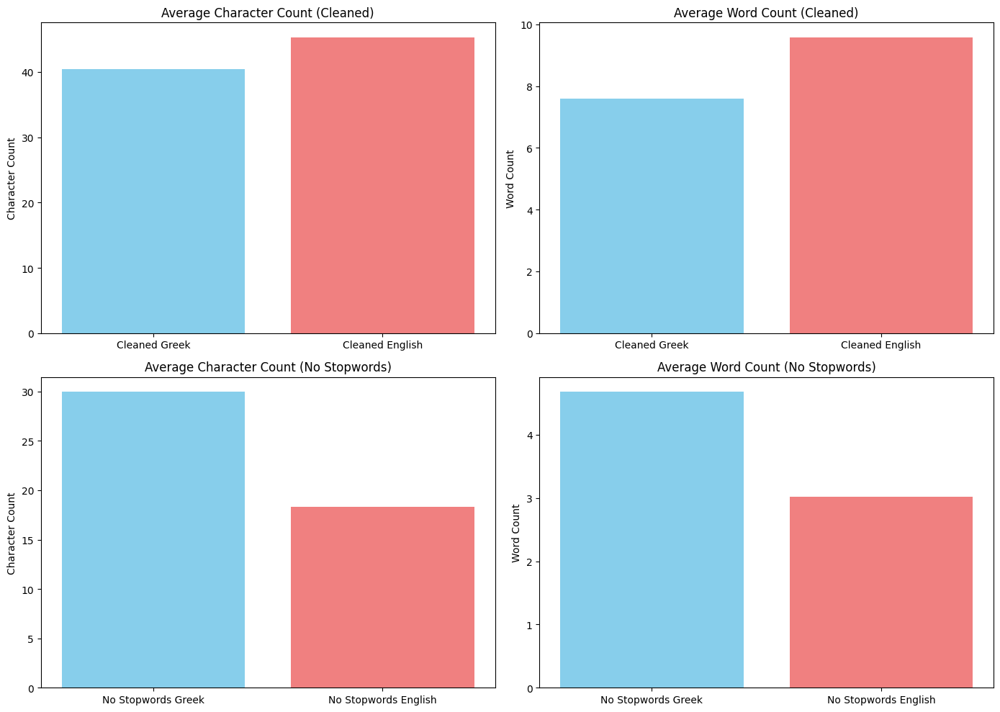

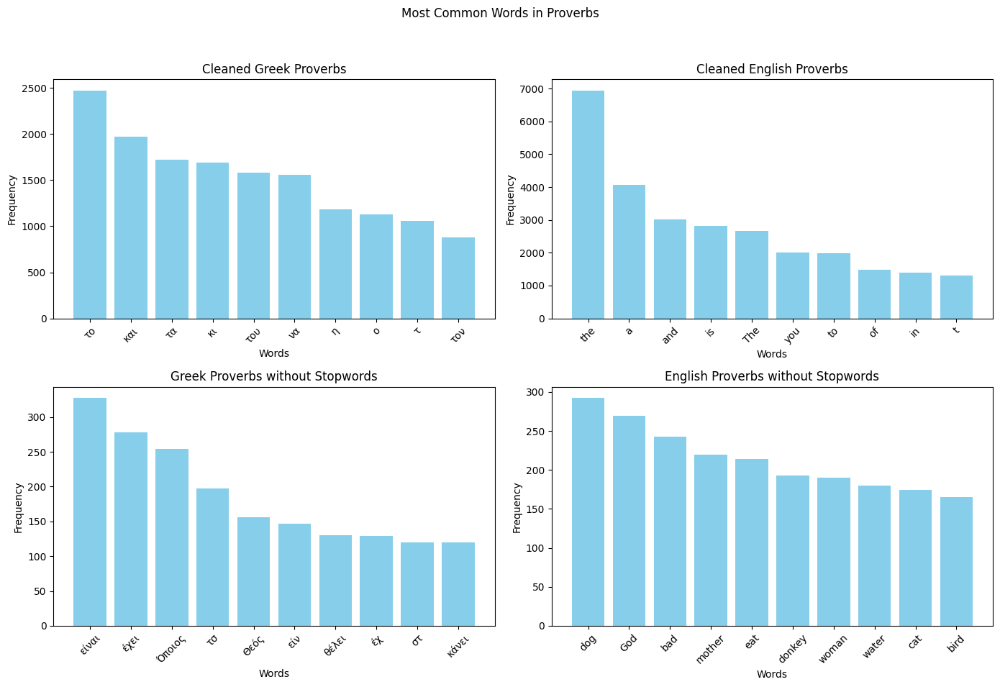

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate character and word counts for each column
data['greek_character_count'] = data['cleaned_greek_proverb'].apply(len)
data['greek_word_count'] = data['cleaned_greek_proverb'].apply(lambda x: len(x.split()))
data['english_character_count'] = data['cleaned_english_proverb'].apply(len)
data['english_word_count'] = data['cleaned_english_proverb'].apply(lambda x: len(x.split()))

data['greek_no_stopwords_character_count'] = data['greek_proverb_no_stopwords'].apply(len)
data['greek_no_stopwords_word_count'] = data['greek_proverb_no_stopwords'].apply(lambda x: len(x.split()))
data['english_no_stopwords_character_count'] = data['english_proverb_no_stopwords'].apply(len)
data['english_no_stopwords_word_count'] = data['english_proverb_no_stopwords'].apply(lambda x: len(x.split()))

# Display the calculated counts for verification
print("Character and Word Counts for Cleaned Greek Proverbs:\n", data[['cleaned_greek_proverb', 'greek_character_count', 'greek_word_count']].head())
print("\nCharacter and Word Counts for Cleaned English Proverbs:\n", data[['cleaned_english_proverb', 'english_character_count', 'english_word_count']].head())
print("\nCharacter and Word Counts for Greek Proverbs without Stopwords:\n", data[['greek_proverb_no_stopwords', 'greek_no_stopwords_character_count', 'greek_no_stopwords_word_count']].head())
print("\nCharacter and Word Counts for English Proverbs without Stopwords:\n", data[['english_proverb_no_stopwords', 'english_no_stopwords_character_count', 'english_no_stopwords_word_count']].head())

# Compute averages
metrics = {
    'Cleaned Greek': [data['greek_character_count'].mean(), data['greek_word_count'].mean()],
    'Cleaned English': [data['english_character_count'].mean(), data['english_word_count'].mean()],
    'No Stopwords Greek': [data['greek_no_stopwords_character_count'].mean(), data['greek_no_stopwords_word_count'].mean()],
    'No Stopwords English': [data['english_no_stopwords_character_count'].mean(), data['english_no_stopwords_word_count'].mean()]
}

# Print average character and word counts
print("\nAverage Character and Word Counts:")
for label, (char_avg, word_avg) in metrics.items():
    print(f"{label} - Average Characters: {char_avg:.2f}, Average Words: {word_avg:.2f}")

# Plot metrics for character and word counts
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Set labels for the plots
titles = ['Average Character Count (Cleaned)', 'Average Word Count (Cleaned)',
          'Average Character Count (No Stopwords)', 'Average Word Count (No Stopwords)']
x_labels = ['Cleaned Greek', 'Cleaned English', 'No Stopwords Greek', 'No Stopwords English']

# Plot character counts
axs[0, 0].bar(x_labels[:2], [metrics['Cleaned Greek'][0], metrics['Cleaned English'][0]], color=['skyblue', 'lightcoral'])
axs[0, 0].set_title(titles[0])
axs[0, 0].set_ylabel('Character Count')

axs[1, 0].bar(x_labels[2:], [metrics['No Stopwords Greek'][0], metrics['No Stopwords English'][0]], color=['skyblue', 'lightcoral'])
axs[1, 0].set_title(titles[2])
axs[1, 0].set_ylabel('Character Count')

# Plot word counts
axs[0, 1].bar(x_labels[:2], [metrics['Cleaned Greek'][1], metrics['Cleaned English'][1]], color=['skyblue', 'lightcoral'])
axs[0, 1].set_title(titles[1])
axs[0, 1].set_ylabel('Word Count')

axs[1, 1].bar(x_labels[2:], [metrics['No Stopwords Greek'][1], metrics['No Stopwords English'][1]], color=['skyblue', 'lightcoral'])
axs[1, 1].set_title(titles[3])
axs[1, 1].set_ylabel('Word Count')

plt.tight_layout()
plt.show()

# Function to plot the most common words in subplots
def plot_most_common_words_subplot(column, title, ax, n=10):
    words = ' '.join(column).split()
    common_words = Counter(words).most_common(n)
    words, counts = zip(*common_words)
    
    ax.bar(words, counts, color='skyblue')
    ax.set_title(title)
    ax.set_xlabel('Words')
    ax.set_ylabel('Frequency')
    ax.tick_params(axis='x', rotation=45)

# Set up a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Most Common Words in Proverbs')

# Plot most common words for each column in subplots
plot_most_common_words_subplot(data['cleaned_greek_proverb'], 'Cleaned Greek Proverbs', axs[0, 0])
plot_most_common_words_subplot(data['cleaned_english_proverb'], 'Cleaned English Proverbs', axs[0, 1])
plot_most_common_words_subplot(data['greek_proverb_no_stopwords'], 'Greek Proverbs without Stopwords', axs[1, 0])
plot_most_common_words_subplot(data['english_proverb_no_stopwords'], 'English Proverbs without Stopwords', axs[1, 1])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

**Average Character Count:**

Greek: The cleaned text averages 40.37 characters, while the no-stopwords text drops to 29.96 characters, indicating that stopwords contribute about 10.41 characters (or 25.8%) to the Greek proverbs.
English: The cleaned text averages 45.28 characters, reducing to 18.32 characters without stopwords, showing a substantial 26.96 character reduction (59.6%). This suggests that English stopwords occupy a larger portion of the character count than Greek.

**Average Word Count:**

**Greek:** The cleaned Greek text averages 7.58 words, and removing stopwords reduces this to 4.68 words. Thus, stopwords contribute approximately 2.9 words on average, a reduction of 38.3%. 

**English:** The cleaned English text averages 9.58 words, dropping to 3.02 words without stopwords, showing a reduction of 6.56 words (68.5%). This significant drop highlights that English proverbs rely heavily on stopwords for structure.The most frequent words include typical English stopwords like "the," "a," "and," "is," and so on.


Removing stop words is essential in text analysis as it helps reduce noise and enhances the focus on meaningful content. Stop words, which are often high-frequency and do not carry significant meaning, can dilute the insights derived from the data.

**Cleaned Greek Proverbs:**, Common words like "το" (the), "και" (and), and other high-frequency Greek words appear frequently, 

**Cleaned English Proverbs*:* The most frequent words include typical English stopwords like "the," "a," "and," "is," and so on.

In the Greek Proverbs without Stopwords, many common words are stop words (e.g., "τζ," "ειν," "σου") that appear frequently due to Greek idiomatic expressions. These words, often used for grammatical structure, are included due to spoken idioms, which makes them appear in varied forms. This results in high counts for certain Greek words that don't carry strong  meaning, affecting the clarity of Greek word frequency analysis. These stop words were manually removed (included in greek stop words list as "idioms" as they were easily distiguished in in top  of  most common greek words list, which seems quite logical as they constitute differently expressed stop words. Moreover in the stoppwordσ were included single capital or lowercase words which also contistute more oral words.

After the removal of less meaningful words in both languages we come into the conclusions below:

**Greek Proverbs without Stopwords**
The most common Greek words highlight important themes in life and values. Words like "Θεός" (God), "μάτια" (eyes), and "νερό" (water) connect to spirituality, perception, and nature. Terms like "θέλει" (wants) and "κάνει" (does) show a focus on desires and actions, reflecting cultural aspirations. The contrast between "καλό" (good) and "κακό" (bad) reveals ongoing discussions about right and wrong. The word "Όποιος" (whoever) indicates how Greek proverbs often express conditions, shaping their wisdom.

**English Proverbs without Stopwords**
In English, the most common words point to everyday life and moral lessons. Animal names like "dog," "cat," and "wolf" suggest that idioms often use animal behavior to teach lessons. Words like "water" and "mother" reflect basic human needs and relationships. The repetition of words such as "bad" and "God" shows a strong focus on moral choices, similar to the Greek proverbs. This pattern highlights the importance of morals and human experiences in sharing wisdom across cultures.

**Overall, both languages utilize proverbs as a means to communicate essential truths about existence, morality, and human relationships, though they do so through different lenses that reflect their unique cultural contexts.**




## 4.Visualisation: Compute frequent English words per location, and visualise the most frequent on a map.

In [15]:
from folium.plugins import MarkerCluster

# Create map
m = folium.Map(location=[39.0742, 21.8243], zoom_start=6)

# Initialize MarkerCluster
marker_cluster = MarkerCluster().add_to(m)

# Group by place and calculate most common words
for place, group in data.groupby('place'):
    words = ' '.join(group['english_proverb_no_stopwords']).split()  # Combine English proverbs into words
    common_words = ', '.join([word for word, _ in Counter(words).most_common(5)])  # Get top 5 words
    
    # Extract coordinates
    lat, lon = group[['lat', 'lon']].iloc[0]
    
    # Add a marker to the cluster
    folium.Marker(
        location=[lat, lon],
        popup=f"<strong>{place}</strong><br>{common_words}"
    ).add_to(marker_cluster)
    print(f"{place}: {common_words}")

Ήπειρος: cat, God, house, eyes, bad
Ήπειρος, Δολιανά: thief, lot, bit, Foreign, day
Ήπειρος, Δρόβιανη: stranger, eat, wolf, fool, fish
Ήπειρος, Ζαγόρι: child, land, sky, kiss, lazy
Ήπειρος, Ζαγόρι, Βίτσα: goat, Meaning, bird, burst, lot
Ήπειρος, Ζαγόρι, Γρεβενίτι: knock, fool
Ήπειρος, Κούρεντα: sits, bezekhi, smoke, shop, poor
Ήπειρος, Κόνιτσα: missing, cat, mother, eyes, moment
Ήπειρος, Κόνιτσα, Βούρμπιανη: sun, miser, penny, pincher, sack
Ήπειρος, Λοζέτσι: walks, woman, reap, died, hurt
Ήπειρος, Τσαμαντάς: wind, plans, zucchini, eaten, bad
Αιτωλία: dog, eyes, bird, English, God
Αιτωλία, Άγραφα: Takes, cold, cookie, feast, phrase
Αιτωλία, Αμβρακιά: bread, Galata, silent, speak, foolishly
Αιτωλία, Κεφαλόβρυσο: lost, edge, bite
Αμοργός: bad, God, dog, woman, fool
Αμοργός, Αρκεσίνη: hole, wind
Αμοργός, Θολάρια: feeds, goats, eat
Αμοργός, Λαγκάδα: March, stored, firewood, April, counted
Αμοργός, Ποταμός: brought, Moses, bones
Αμοργός, Χώρα: God, hear, crowing, rooster
Ανατολική Θράκη: dog

In [16]:
# Display map
m

Most words likely symbolize concepts, beliefs, or characteristics associated with each place, reflecting local customs, folklore, or expressions. For instance, terms like "dog," "God," "mother," "goat," and "fool" appear frequently, suggesting common themes across regions, possibly reflecting cultural values, nature, spirituality, or common archetypes in folk sayings or stories. Some entries also reference specific animals, natural elements, or personal qualities like "priest," "donkey," "envy," and "bride," adding a layer of traditional lifestyle and social structure.

The regions span a wide geographical area, covering mainland Greece, islands, and Cyprus, capturing diverse linguistic and cultural variations. 

## Normalisation: The translation and the post-processing step will yield many (Greek) to one (English) proverbs. Create a visualisation to show the translations that correspond to more than one Greek proverbs.

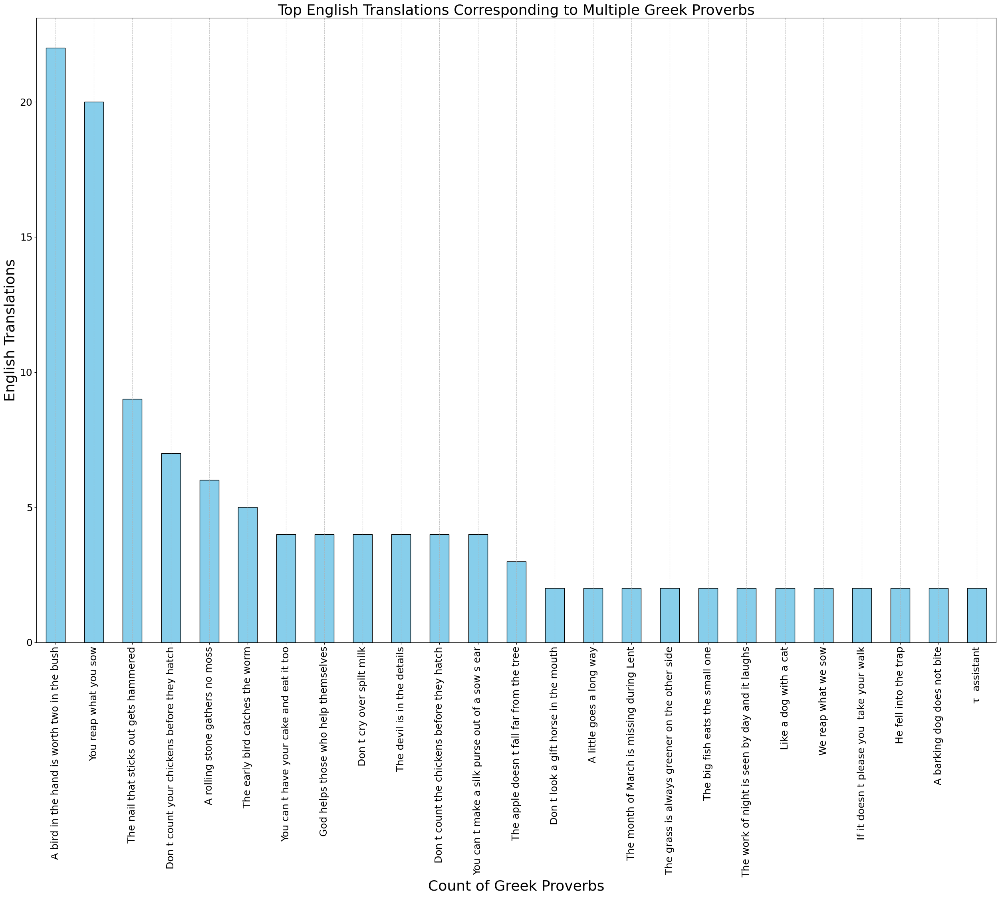

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Count occurrences of English translations
translation_counts = data['cleaned_english_proverb'].value_counts()

# Filter out blank or whitespace-only translations, then keep translations with more than one Greek proverb
filtered_translations = translation_counts[translation_counts.index.str.strip() != ""]
filtered_translations = filtered_translations[filtered_translations > 1]

# Select the top 25 translations
top_translations = filtered_translations.head(25)

# Create a horizontal bar chart
plt.figure(figsize=(25, 20))
top_translations.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Top English Translations Corresponding to Multiple Greek Proverbs', fontsize=26)
plt.xlabel('Count of Greek Proverbs', fontsize=26)
plt.ylabel('English Translations', fontsize=26)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()

# Adjust tick label size
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Show the plot
plt.show()


The visualization highlights how some common English expressions can capture the essence of many Greek sayings, reflecting universal themes like caution, effort, reward, and resilience.

The proverb "A bird in the hand is worth two in the bush" is the most common translation, used for more than 20 different Greek proverbs.
Other frequently used phrases include "You reap what you sow" and "The nail that sticks out gets hammered."
These common English proverbs represent similar sentiments or morals in various Greek proverbs, highlighting cultural similarities in expressions of wisdom.